In [4]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
# TODO: automate with nice data configs of selected variables etc.
# TODO: logging functions
# TODO: NNs!


# file handling
from pathlib import Path
import pickle
import warnings

# spatial
import xarray as xa
import geopandas as gpd
import cartopy.crs as ccrs

# general
from datetime import datetime
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
# import holoviews as hv
# from holoviews import opts
# from holoviews.plotting.links import RangeToolLink
from datetime import datetime

# processing
from dask.distributed import get_client, Client, LocalCluster
import dask
import joblib

# ml
from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, cross_val_score, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
import sklearn.metrics as sklmetrics
from sklearn import svm, datasets
import xgboost as xgb
from sklearn.ensemble import GradientBoostingClassifier

# custom
from coralshift.dataloading import config, get_data
from coralshift import functions_creche
from coralshift.processing import spatial_data
from coralshift.machine_learning import baselines
from coralshift.plotting import spatial_plots
from coralshift.utils import utils

# set data folder path
data_fp = config.data_folder

In [2]:
RESOLUTION = 0.01
LATS = [-32, 0]
LONS = [130, 170]

# Couce 2013

## Coral presence and shallow water mask

In [3]:
# load unep and gebco data
unep_xa = get_data.generate_unep_xarray(RESOLUTION)
gebco_xa = get_data.generate_gebco_xarray(RESOLUTION)
# gebco_xa

UNEP xarray at 0-01 already exists.
Gebco xarray at 0-01 already exists.


In [5]:
DEPTH_MASK_LIMS = [-100, 20]

# restrict arrays to region of interest
xa_unep_lim = unep_xa.sel(latitude=slice(min(LATS),max(LATS)),longitude=slice(min(LONS),max(LONS)))
gebco_xa_lim = gebco_xa.sel(latitude=slice(min(LATS),max(LATS)),longitude=slice(min(LONS),max(LONS)))

# limit elevation data array via depth_mask_lims
shallow_masked_gebco = gebco_xa_lim.where(
    (gebco_xa_lim["elevation"] < max(DEPTH_MASK_LIMS)) & (gebco_xa_lim["elevation"] > min(DEPTH_MASK_LIMS)), np.nan)
# # all zero values of coral presence to nan to make mask more clear
nan_xa_unep = unep_xa.where(unep_xa != 0, np.nan)

# gbr_xa_unep = unep_xa.sel(latitude=slice(min(LATS),max(LATS)),longitude=slice(min(LONS),max(LONS)))
gbr_norm_nan_xa_unep = (xa_unep_lim / np.nanmax(xa_unep_lim["unep_coral_presence"].values)).where(xa_unep_lim != 0, np.nan)

In [ ]:
# PLOT DEPTH MASK
fig, ax = plt.subplots(figsize=(50, 50), subplot_kw=dict(projection=ccrs.PlateCarree()), dpi=300)

spatial_plots.plot_spatial(
    shallow_masked_gebco["elevation"], 
    title=None, cbar=True, presentation=False, fax=(fig, ax), alpha=0.5, cmap_type = ["#0316a6", "#3ecfe6"],
    cbar_name="Depth", labels=["l","b"], cbar_frac=0.04)

spatial_plots.plot_spatial(
    gbr_norm_nan_xa_unep["unep_coral_presence"], 
    title="Rasterised UNEP Reef Presence", cbar=False, cmap_type = ["#db3e00", "#db3e00"], presentation=False, 
    fax=(fig, ax), alpha=1, cbar_name="Normalised reef presence", labels=["l","b"])

# TODO: cbar name, relative size. Make kwarg. 

## Model fitting



In [112]:
# generate some dummy X and y data for a classification problem
X = np.random.rand(100, 2)
y = (X[:, 0] + X[:, 1] > 1).astype(int)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from coralshift.machine_learning import baselines
# sklearn randomizedsearchcv
from coralshift import functions_creche
import time
from joblib import dump, load

# TODO: implement early stopping
# TODO: link with wandb
# TODO: save models, with metadata re training (training time, split type, random search params, grid search params)

model_train_info = {
    "Resolution": "test", 
    "split_type": "n/a"}


def save_model_with_metadata():
    print("todo")

model_dict = {
    "Logistic Regression": LogisticRegression(),
    "Gradient Boosting Classifier": GradientBoostingClassifier(),
    "Random Forest Classifier": RandomForestClassifier(),
}


for model_type in tqdm(model_dict.keys(), total=len(model_dict)):
    model_instance = functions_creche.ModelInitialiser(model_type)
    # random search
    print(f"conducting random search for {model_type}")
    random_search_object = functions_creche.initialise_sklearn_random_search(model_instance)
    random_search_result = random_search_object.fit(X, y)

    # grid search
    best_params_dict = random_search_result.best_params_
    grid_search_object = functions_creche.initialise_sklearn_grid_search(model_instance.get_model(), best_params_dict)
    grid_search_result = grid_search_object.fit(X, y)

    # save best model features
    random_pkl_name = f"model_type_{model_type}.pickle"
    # make sure model path exists
    model_save_dir = Path("/models").mkdir(exist_ok=True)
    
    random_pkl_fp = 
    grid_search_result.best_params_


In [145]:
model_instance

TypeError: 'ModelInitialiser' object is not callable

In [143]:
model_instance.model_info["model_type"]

TypeError: list indices must be integers or slices, not str

In [140]:
with open(model_instance.)

pickle.dumps(grid_search_result.best_params_)

b'\x80\x04\x95]\x00\x00\x00\x00\x00\x00\x00}\x94(\x8c\tbootstrap\x94\x88\x8c\tmax_depth\x94K#\x8c\x10min_samples_leaf\x94K\x01\x8c\x11min_samples_split\x94K\x05\x8c\x0cn_estimators\x94M\x80\x0cu.'

## ROC Curves

In [153]:
def calculate_model_roc_score(model, test_X, test_y):
    # predict probabilities
    lr_probs = model.predict_proba(test_X)
    # keep probabilities for the positive outcome only (in second column of lr_probs array)
    lr_probs_pos = lr_probs[:, 1]

    return calculate_roc_score(test_y, lr_probs_pos)


def calculate_roc_score(test_y, probs_pos):
    # calculate scores
    auc = sklmetrics.roc_auc_score(test_y, probs_pos) # logistic regression
    # summarize scores
    print(f"ROC AUC = {auc:.3f}")
    # calculate roc curves
    fpr, tpr, _ = sklmetrics.roc_curve(test_y, probs_pos)
    return fpr, tpr, auc

def plot_roc_curve(fpr, tpr, title: str="ROC Curve", label: str="Logistic"):
    plt.plot(fpr, tpr, marker='.', label=label)

### EVALUATE OVER MULTIPLE RUNS


# models = [
#     LogisticRegression(solver='lbfgs', max_iter=1000),
#     GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=0)
# ]



num_runs = 10
DATA_SUBSAMPLE = 10000

fpr_list = []
tpr_list = []
auc_list = []

for j, (model_name, model) in tqdm(enumerate(model_dict.items()), total=len(model_dict)):
    # TODO: hyperparameter tuning
    print(f"Running model: {model_name}")
    for i, random_state in tqdm(enumerate(range(num_runs)), total=num_runs):
        # get data with different test/train/val split
        (train_X, train_y), (test_X, test_y), (val_X, val_y) = get_data.get_ml_ready_static_data(random_state=random_state)

        # setting threshold to be 0 for reef presence for now (any coral present = 1)
        train_y, test_y, val_y = [functions_creche.cont_to_class(y, 0) for y in [train_y, test_y, val_y]]

        test_X = test_X[:DATA_SUBSAMPLE]
        test_y = test_y[:DATA_SUBSAMPLE]
        train_X = train_X[:DATA_SUBSAMPLE]
        train_y = train_y[:DATA_SUBSAMPLE]

        model.fit(train_X, train_y)
        fpr, tpr, auc_value = calculate_model_roc_score(model, test_X, test_y)

        # Append variable-length arrays to the lists
        fpr_list.append(fpr)
        tpr_list.append(tpr)
        auc_list.append(auc_value)

  0%|          | 0/3 [00:00<?, ?it/s]

Running model: Logistic Regression


/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC AUC = 0.926


/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC AUC = 0.925


/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC AUC = 0.926


/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC AUC = 0.924


/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC AUC = 0.928


/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC AUC = 0.924


/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC AUC = 0.926


/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC AUC = 0.932


/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC AUC = 0.929


/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 33%|███▎      | 1/3 [01:17<02:35, 77.90s/it]

ROC AUC = 0.926
Running model: Gradient Boosting Classifier


ROC AUC = 0.957


ROC AUC = 0.954


ROC AUC = 0.956


ROC AUC = 0.955


ROC AUC = 0.955


ROC AUC = 0.957


ROC AUC = 0.956


ROC AUC = 0.959


ROC AUC = 0.956


 67%|██████▋   | 2/3 [21:11<12:13, 733.91s/it]

ROC AUC = 0.960
Running model: Random Forest Classifier


ROC AUC = 0.955


ROC AUC = 0.954


ROC AUC = 0.953


ROC AUC = 0.952


ROC AUC = 0.956


ROC AUC = 0.955


ROC AUC = 0.958


ROC AUC = 0.957


ROC AUC = 0.959


100%|██████████| 3/3 [24:37<00:00, 492.39s/it]

ROC AUC = 0.959


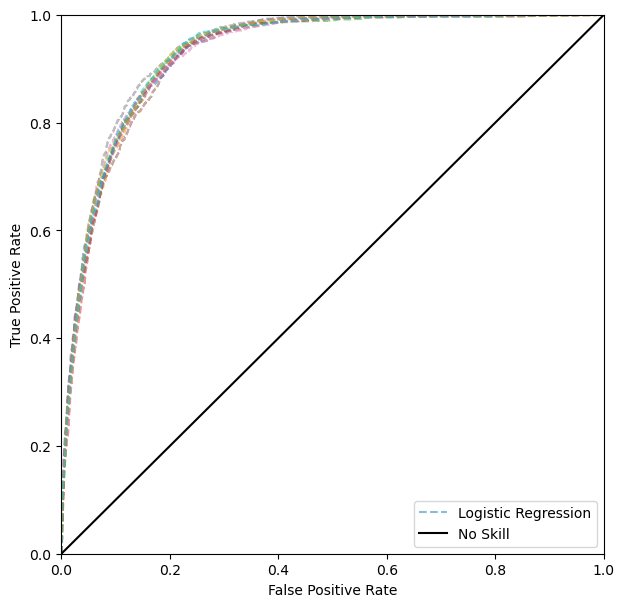

In [ ]:
fig, ax = plt.subplots(figsize=(7,7))
# generate a no skill prediction (majority class). TODO: is this correct for an imbalanced dataset?
ns_probs = [0 for _ in range(len(test_y))]
ns_fpr, ns_tpr, _ = sklmetrics.roc_curve(test_y, ns_probs)

lss = [
    # (0, (1,10)),
    "--", "-."]

for m, model in enumerate(model_dict.keys()):
    ls = lss[m]
    for i in range(num_runs):
        list_num = m + i
        # if list_num < len()

        ax.plot(fpr_list[list_num], tpr_list[list_num], marker='', ls=ls, alpha=0.5, label=model if i == 0 else "")

ax.plot(ns_fpr, ns_tpr, linestyle='-', c="k", label='No Skill')
# formatting
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_xlim((0,1))
ax.set_ylim((0,1))
ax.legend()


In [ ]:
gb_model = model_dict["Gradient Boosting"]
gb_model.fit(train_X, train_y)

GradientBoostingClassifier(random_state=0)

In [ ]:
lr_model = model_dict["Logistic Regression"]
lr_model.fit(train_X, train_y)

LogisticRegression(max_iter=1000)

In [ ]:
prob_values = gb_model.predict(test_X)
prob_values.shape

(10000,)

(array([  43.,   82.,   84.,  102.,  120.,  188.,  283.,  369.,  591.,
        8138.]),
 array([0.05711287, 0.1509979 , 0.24488293, 0.33876796, 0.43265298,
        0.52653801, 0.62042304, 0.71430807, 0.80819309, 0.90207812,
        0.99596315]),
 <BarContainer object of 10 artists>)

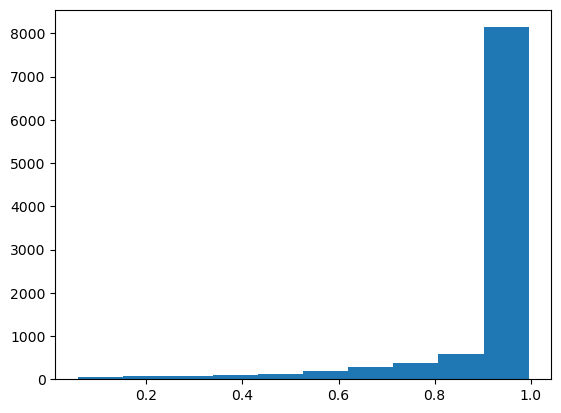

In [ ]:
plt.hist(prob_values[:,0])

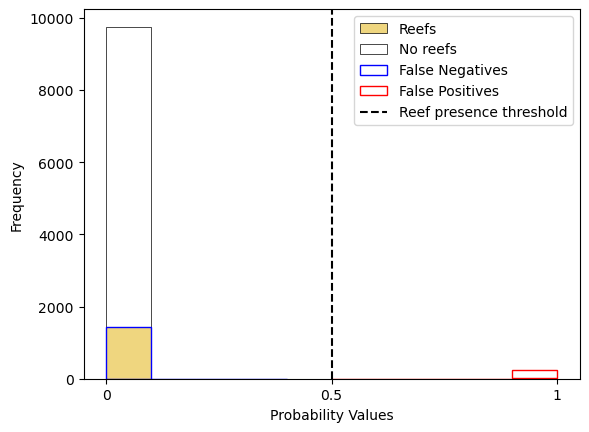

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

fig, ax = plt.subplots()

prob_values = lr_model.predict(train_X)
presence_absence = test_y

# Separate the probability values based on presence/absence
prob_values_present = prob_values[presence_absence == 1]
prob_values_absent = prob_values[presence_absence == 0]

# Plot the stacked histogram with a blue outline for "Reefs" bars with probabilities below 0.5
n, bins, patches = ax.hist([prob_values_present, prob_values_absent],
                            histtype="bar", stacked=True, color=[(225/255,175/255,0,0.5), "white"],
                            bins=10, label=["Reefs", "No reefs"],
                            edgecolor="k", linewidth=0.5)

# Add labels and legend
plt.xlabel('Probability Values')
plt.ylabel('Frequency')

present_ticker, absent_ticker = 0, 0
for i, (rect_present, rect_absent) in enumerate(zip(patches[0], patches[1])):
    (x_present, y_present), width_present, height_present = rect_present.get_xy(), rect_present.get_width(), rect_present.get_height()
    (x_absent, y_absent), width_absent, height_absent = rect_absent.get_xy(), rect_absent.get_width(), rect_absent.get_height()

    if x_present < 0.4:
        if present_ticker == 0:
            ax.add_patch(Rectangle((x_present, y_present), width_present, height_present, linewidth=1, edgecolor='blue', facecolor='none', label="False Negatives"))
        else:
            ax.add_patch(Rectangle((x_present, y_present), width_present, height_present, linewidth=1, edgecolor='blue', facecolor='none'))
        present_ticker += 1

    if x_absent > 0.45:
        if absent_ticker == 0:
            ax.add_patch(Rectangle((x_absent, y_absent), width_absent, height_absent, linewidth=1, edgecolor='red', facecolor='none', label="False Positives"))
        else:
            ax.add_patch(Rectangle((x_absent, y_absent), width_absent, height_absent, linewidth=1, edgecolor='red', facecolor='none'))
        absent_ticker += 1

ax.set_xticks([0, 0.5, 1])
ax.set_xticklabels([0, 0.5, 1])
ax.axvline(0.5, 0, 100, color="black", linestyle="--", label="Reef presence threshold")

plt.legend(loc="upper right")


# Show the plot
plt.show()


In [ ]:
lr_model.predict(test_X).shape

(10000,)

In [ ]:
out_xa = spatial_data.process_xa_d(out.to_xarray(), chunk_dict=None)

## Spatial confusion matrices

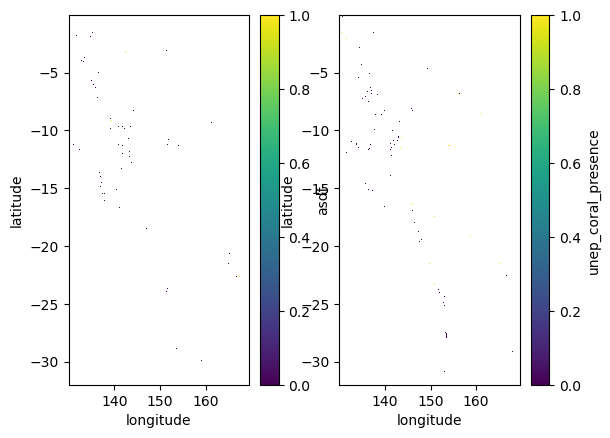

In [ ]:
fig, ax = plt.subplots(ncols=2)

out_xa["asdf"].plot(ax=ax[0])
out_xa["unep_coral_presence"].plot(ax=ax[1])

# Sully 2022

In [87]:
# Visualising Reef Check data distribution

# get points dataframe
reef_check_points_df = get_data.generate_reef_check_points()

# calculate fractional cover for any healthy coral
reef_check_points_df = functions_creche.fractional_cover_from_reef_check(reef_check_points_df, substrate_codes=["HC", "SC"])

# limit to region of interest
reef_check_points_local_df = reef_check_points_df[
    reef_check_points_df.longitude.between(min(LONS),max(LONS)) & reef_check_points_df.latitude.between(min(LATS),max(LATS))
    ]

Reef Check point data at data/ground_truth/reef_check/reef_check_points.pkl already exists.


/tmp/ipykernel_1208116/1094749202.py:14: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


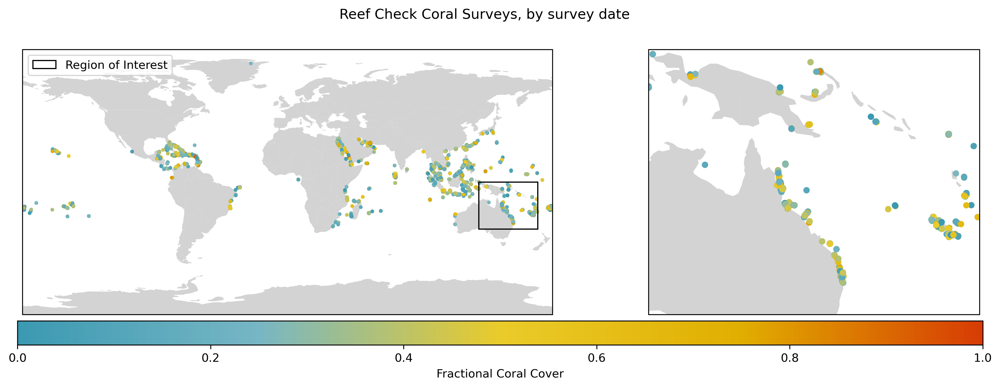

In [99]:
from matplotlib.colors import Normalize
from matplotlib import cm
from matplotlib.patches import Rectangle, Patch


# Create subplots
fig, (ax_global, ax_local) = plt.subplots(
    ncols=2, figsize=(15, 5), subplot_kw=dict(projection=ccrs.PlateCarree()), dpi=300, gridspec_kw={'width_ratios': [1.6, 1]})

# Scatter plot for global and local data
cmap = spatial_plots.get_cbar("seq")

countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
# Plot countries and grid for both axes
for axis in (ax_global, ax_local):
    countries.plot(color="lightgrey", ax=axis)
    axis.grid(alpha=0.5)

im_global = reef_check_points_df.sort_values(by='fractional_cover', ascending=True).plot(
  x="longitude", y="latitude", kind="scatter", c=(reef_check_points_df['fractional_cover']),
  colormap=cmap, title="", ax=ax_global, s=5, colorbar=False)
im_local = reef_check_points_local_df.sort_values(by='fractional_cover', ascending=True).plot(
    x="longitude", y="latitude", kind="scatter", c=(reef_check_points_local_df['fractional_cover']),
    colormap=cmap, title="", ax=ax_local, colorbar=False, alpha=1)

# Add a rectangle to the global axis to show the local area
rect = Rectangle((min(LONS), min(LATS)), max(LONS) - min(LONS), max(LATS) - min(LATS),
                linewidth=1, edgecolor='black', facecolor='none')
ax_global.add_patch(rect)

# Set limits for the local axis
ax_local.set_xlim((min(LONS),max(LONS)))
ax_local.set_ylim((min(LATS),max(LATS)))

# TODO: stop normalisation
# Create a single colorbar using ScalarMappable
norm = Normalize(vmin=min(reef_check_points_df['fractional_cover']), vmax=max(reef_check_points_df['fractional_cover']))
sm_global = cm.ScalarMappable(cmap=cmap, norm=norm)

# Add colorbar (horizontal) below both subplots
cbar = fig.colorbar(sm_global, ax=[ax_global, ax_local], orientation='horizontal', pad=0.02, aspect=40)

# cbar = fig.colorbar(im_global, ax=[ax_global, ax_local], orientation='horizontal', pad=0.02, aspect=40, 
#     vmin=min(reef_check_points_df['fractional_cover']), vmax=max(reef_check_points_df['fractional_cover']))


# Set title for the colorbar
cbar.set_label('Fractional Coral Cover')

# Dummy plot for legend on the local axis
legend_rect_dummy = Rectangle((0, 0), 0, 0, linewidth=1, edgecolor='black', facecolor='none', label='Region of Interest')
ax_global.legend(handles=[legend_rect_dummy], loc='upper left')

plt.suptitle("Reef Check Coral Surveys, by survey date")

plt.show()

# Other nice plots

## Exploring holoview plotting

In [1]:
import xarray as xa

cmip6_fp = "/maps/rt582/coralshift/data/env_vars/cmip6/EC-Earth3P-HR/r1i1p2f1_latlon/concatted_vars/mlotst_rsdo_so_thetao_tos_uo_vo_195001-201412.nc"
all_vars_xa = xa.open_dataset(cmip6_fp)

In [3]:
all_vars_xa["thetao"]

<xarray.DataArray 'thetao' (time: 780, latitude: 720, longitude: 1440)>
[808704000 values with dtype=float32]
Coordinates:
  * time       (time) datetime64[ns] 1950-01-16T12:00:00 ... 2014-12-16T12:00:00
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * latitude   (latitude) float64 -78.74 -78.49 -78.24 ... 100.5 100.8 101.0

In [6]:
# plot spatial
import hvplot.xarray

thetao1d = all_vars_xa["thetao"].isel(latitude=100, longitude=100)
thetao1d.hvplot()

:Curve   [time]   (thetao)

In [28]:
# import hvplot.xarray
# air_temp = xa.tutorial.open_dataset("air_temperature")

# create a dummy xarray spatial timeseries dataset manually
import xarray as xa
import numpy as np
import pandas as pd
%matplotlib widget
times = pd.date_range("2000-01-01", "2000-12-31", name="time")
latitudes = np.arange(-90, 91, 1)
longitudes = np.arange(-180, 180, 1)
data = np.random.randn(len(times), len(latitudes), len(longitudes))
air_temp = xa.Dataset(
    {"air": (["time", "lat", "lon"], data)},
    coords={
        "time": times,
        "lat": latitudes,
        "lon": longitudes,
    },)

air1d = air_temp.air.isel(lat=0, lon=0)
plot = air1d.hvplot()


In [29]:
hvplot.save(plot, "test.html")

In [149]:
import xarray as xr
import numpy as np
import holoviews as hv
from holoviews import opts
hv.extension('matplotlib', logo=False)

opts.defaults(opts.Scatter3D(color='Value', cmap='fire', edgecolor='black', s=50))

:HoloMap   [time]
   :Image   [longitude,latitude]   (mlotst)
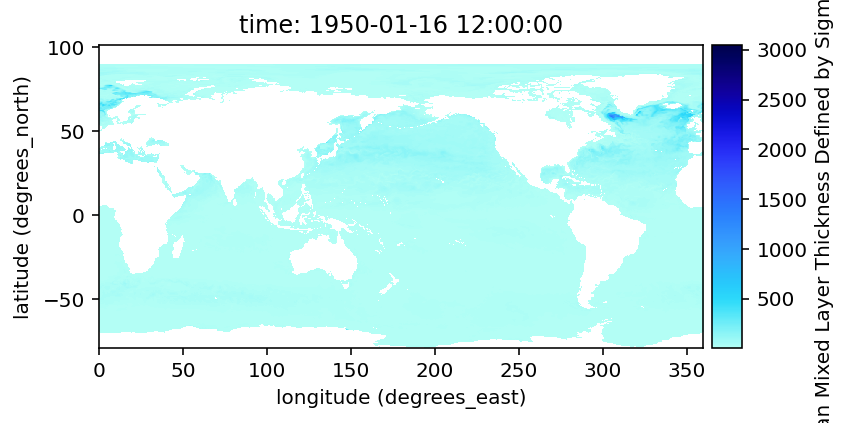
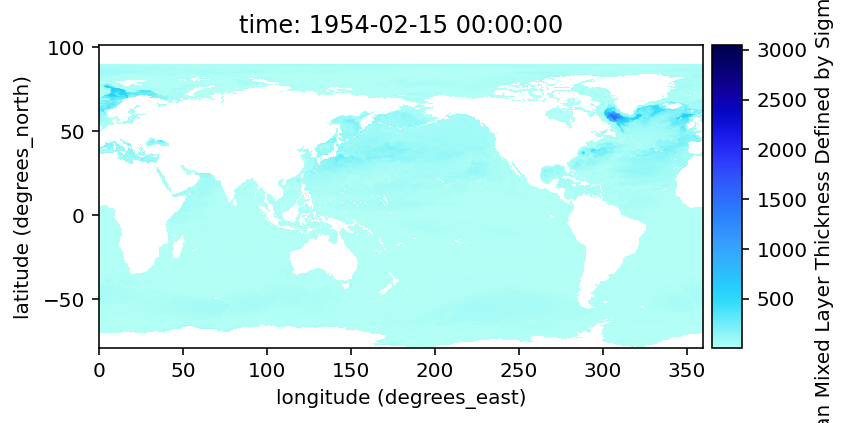
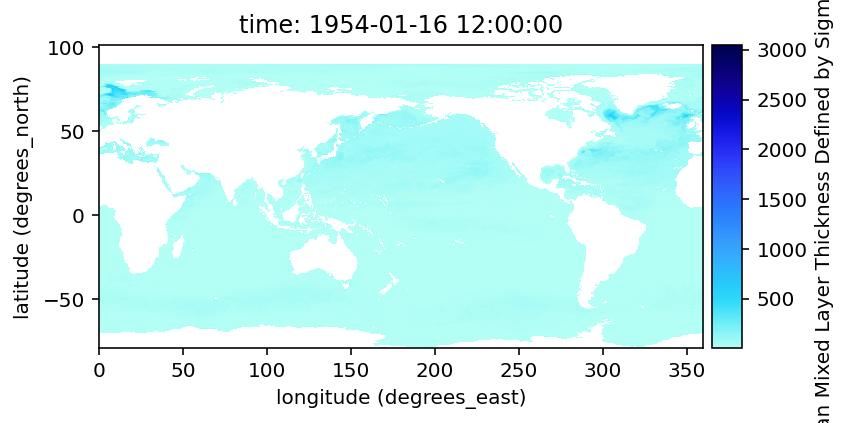
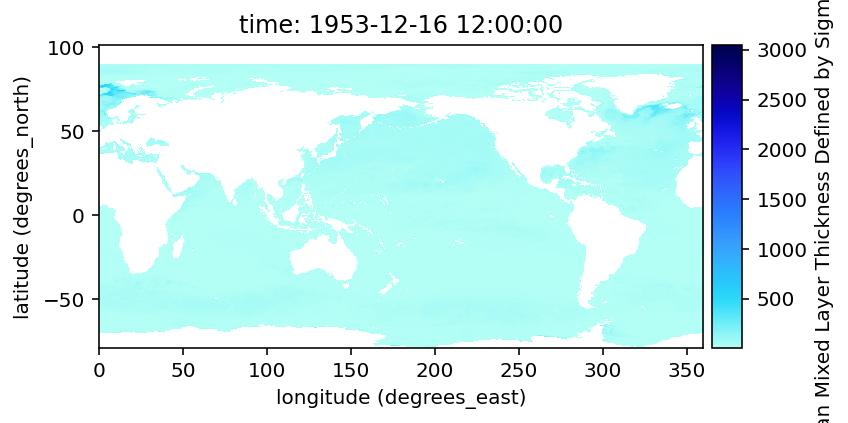
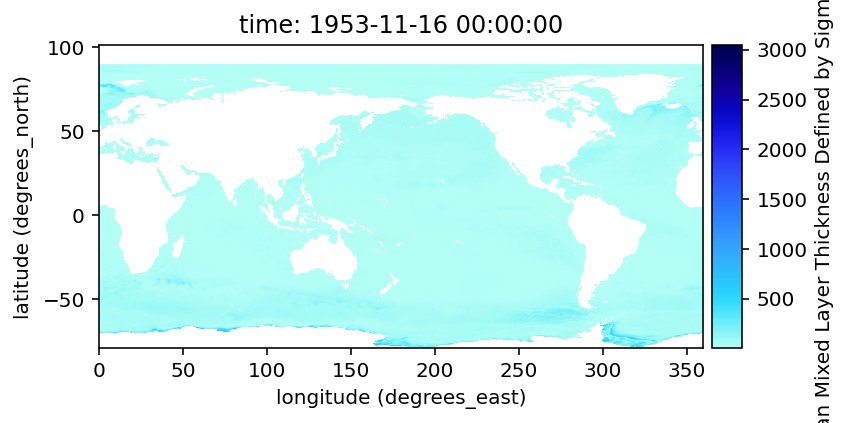
...
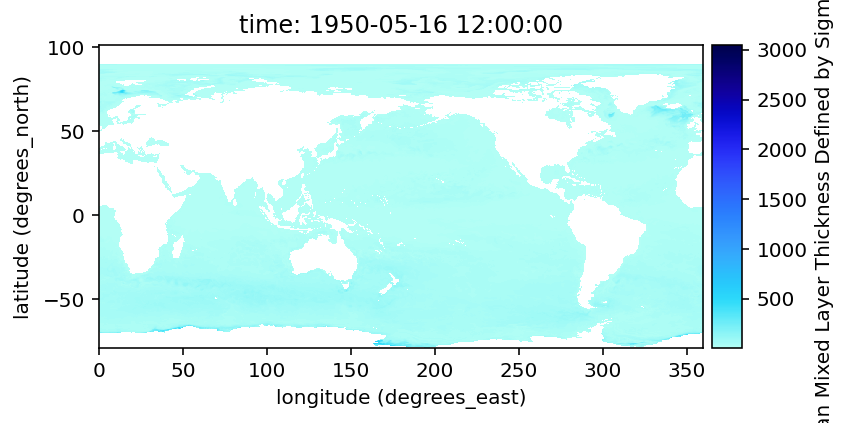
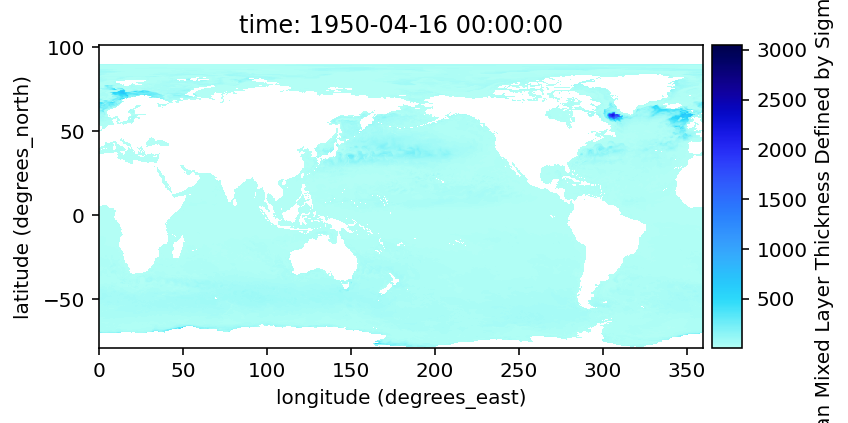
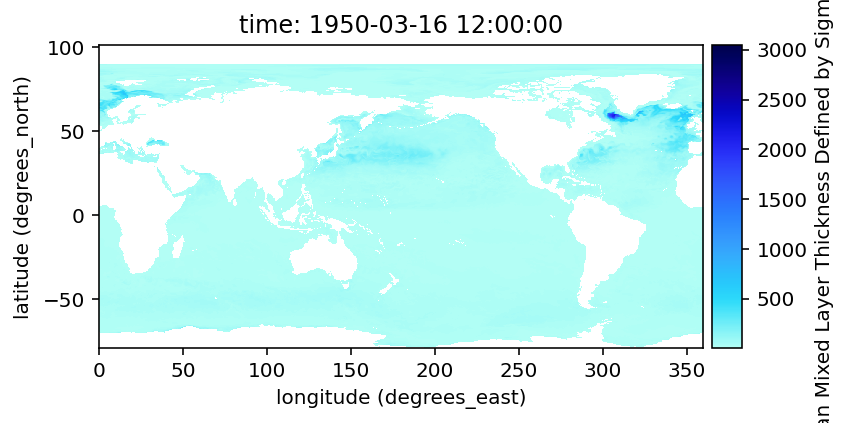
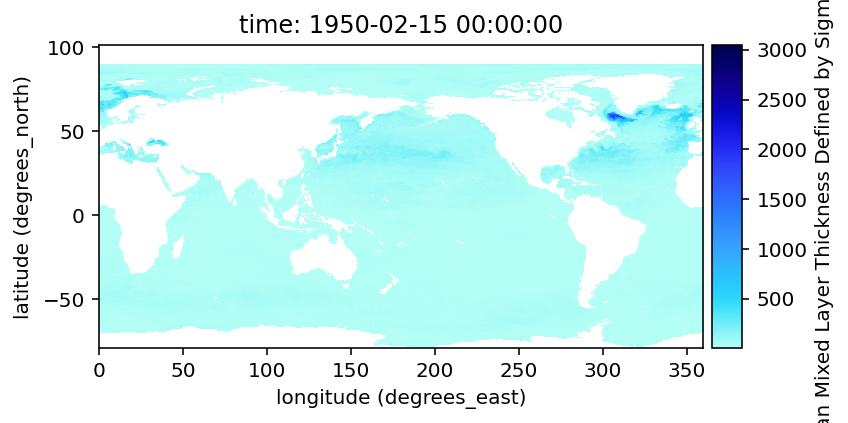
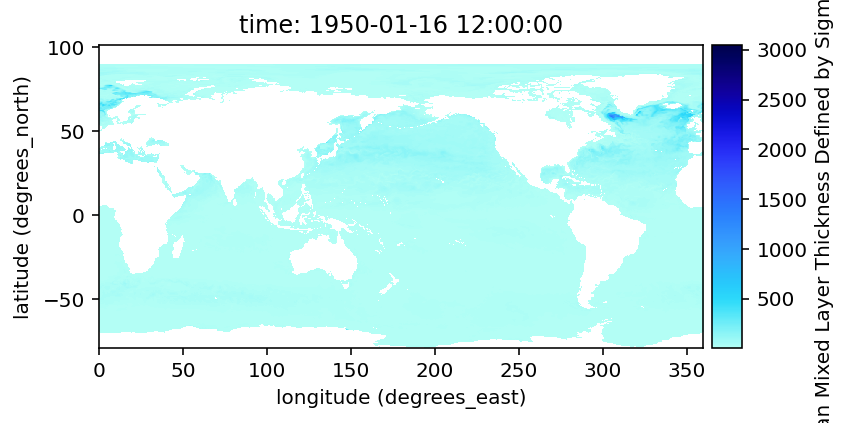

In [152]:
%matplotlib inline

opts.defaults(opts.Scatter3D(color="Value", cmap="fire", edgecolor="black", s=50))
hv_ds = hv.Dataset(all_vars_xa["mlotst"].isel(time=slice(0, 50)))

var = hv_ds.to(hv.Image, kdims=["longitude", "latitude"], dynamic=False)
var[:, :, :].opts(colorbar=True, fig_size=150)

In [151]:
import xarray as xr
import numpy as np
import holoviews as hv
from holoviews import opts
hv.extension('matplotlib')

xr_ds = all_vars_xa["mlotst"].isel(time=slice(0, 24)).sel(latitude=slice(min(LATS), max(LATS)), longitude=slice(min(LONS), max(LONS)))

hv_ds = hv.Dataset(xr_ds)[:, :, :]
print(hv_ds)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Dataset   [time,longitude,latitude]   (mlotst)


:HoloMap   [time]
   :Image   [longitude,latitude]   (mlotst)
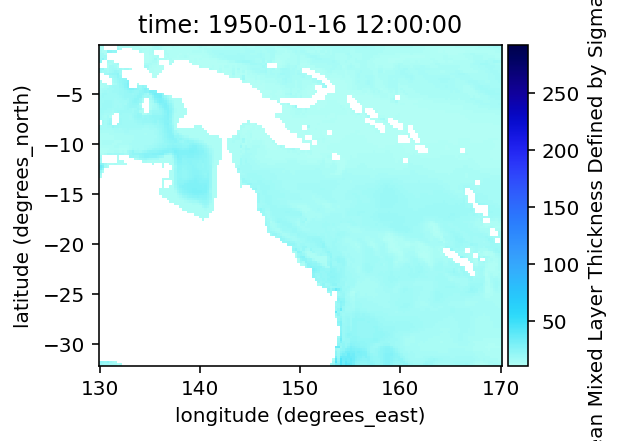
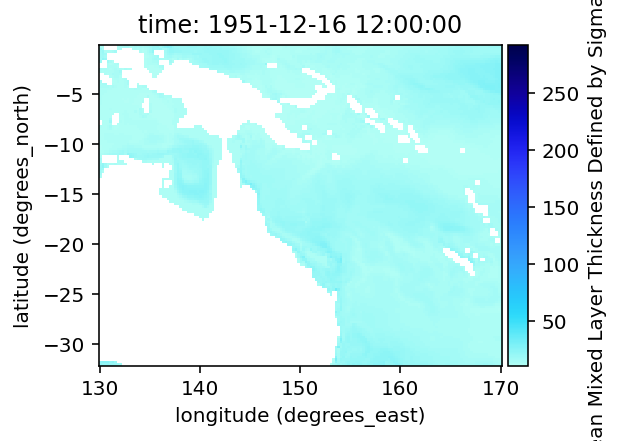
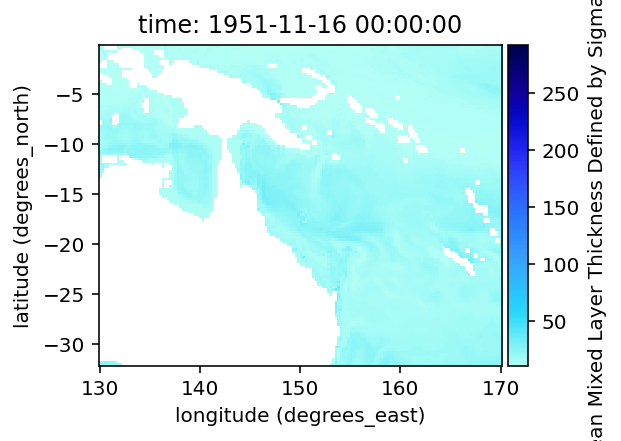
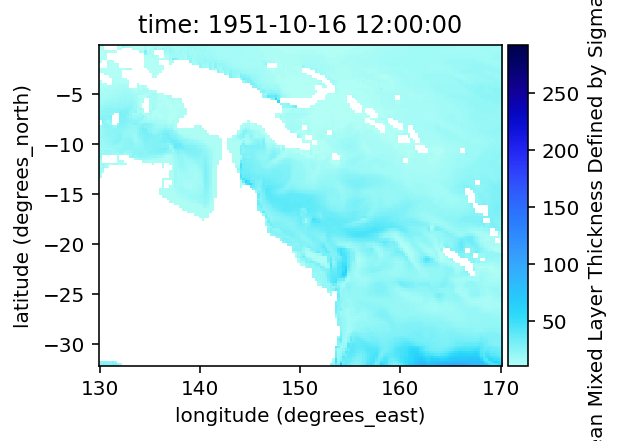
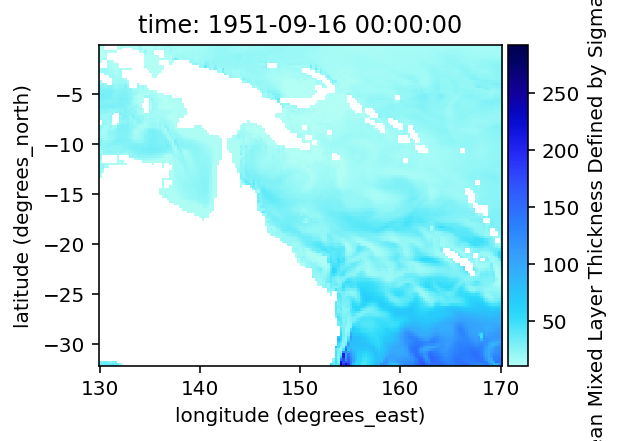
...
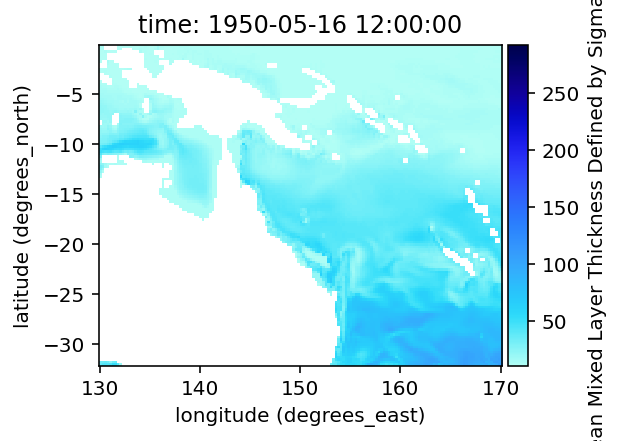
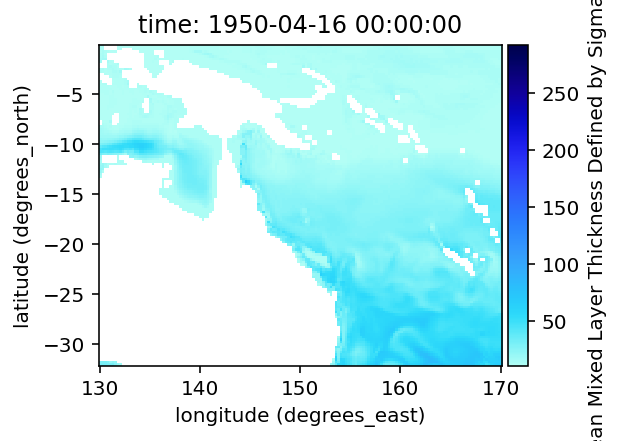
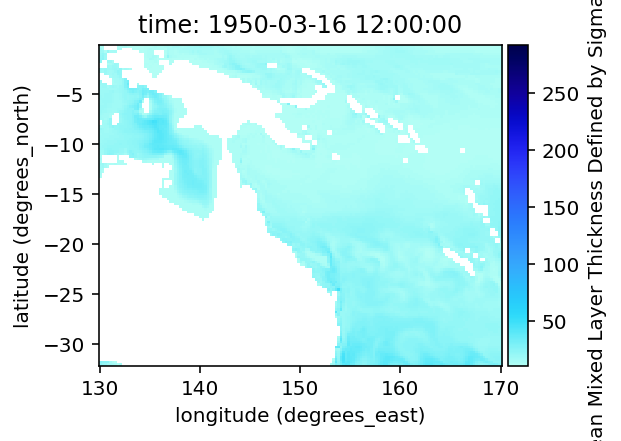
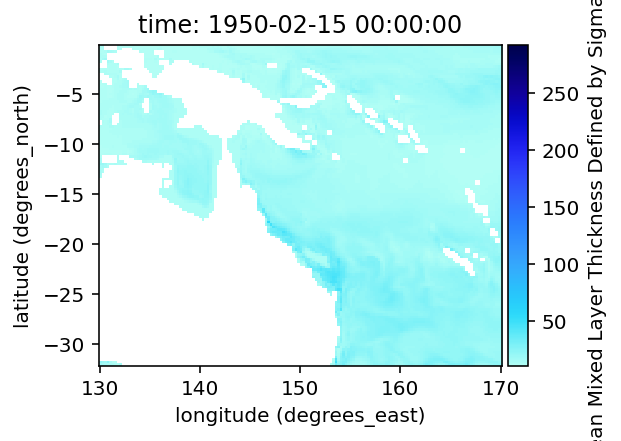
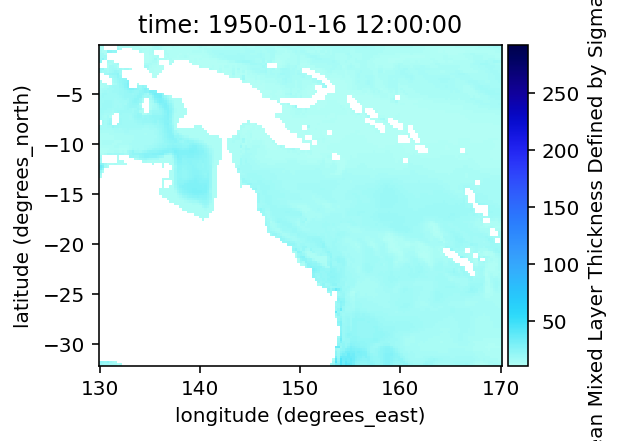

In [47]:
mlotst = hv_ds.to(hv.Image, kdims=["longitude", "latitude"], dynamic=False)
mlotst[:, :, :].opts(colorbar=True, fig_size=100)
# wasn't plotting until reopening notebooks

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:HoloMap   [time]
   :Image   [longitude,latitude]   (mlotst)
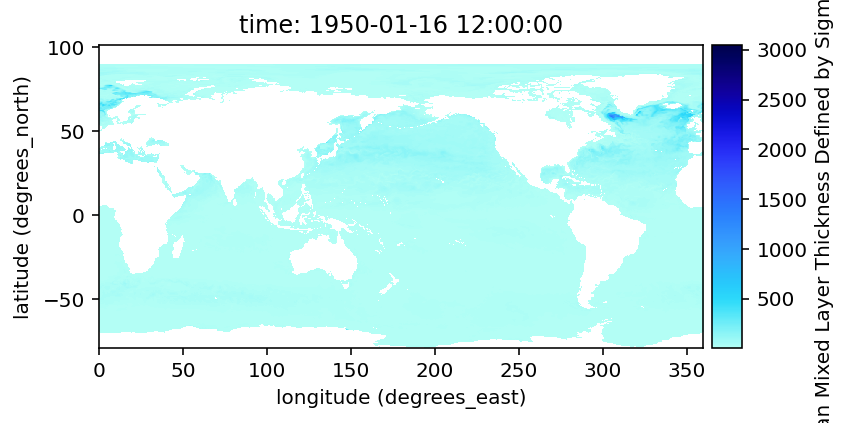
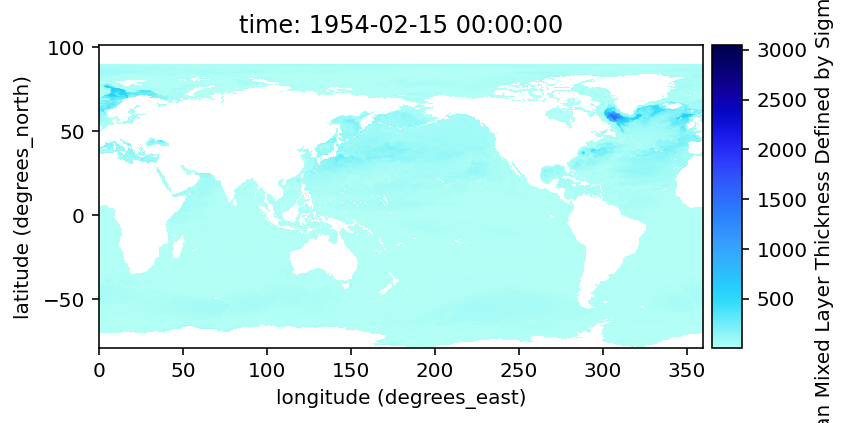
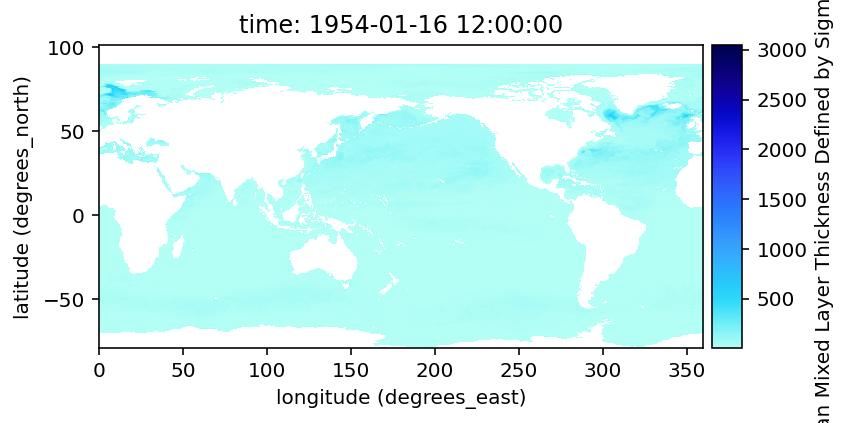
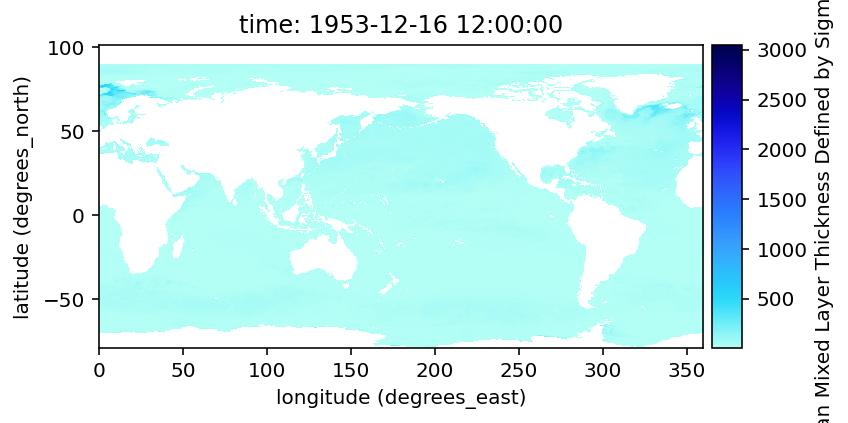
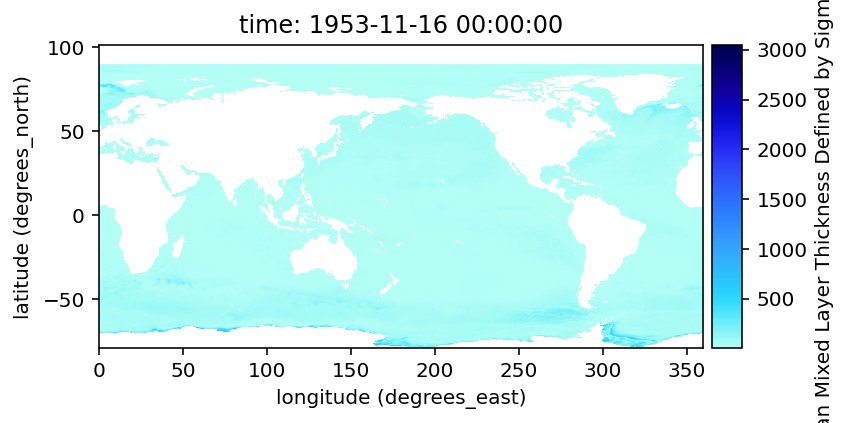
...
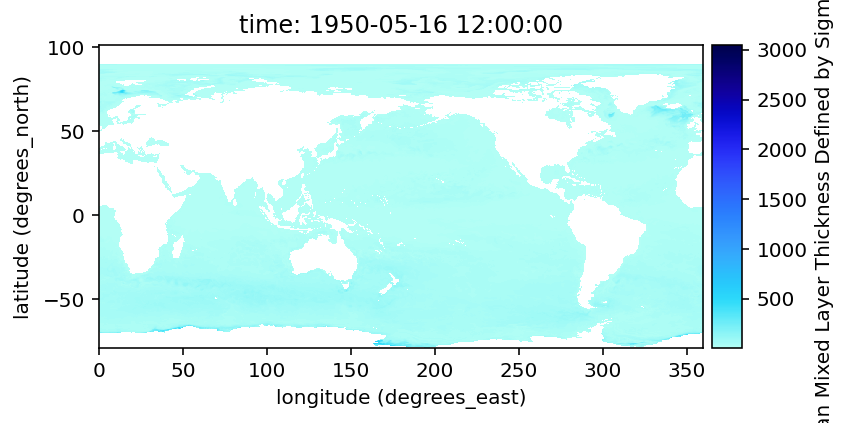
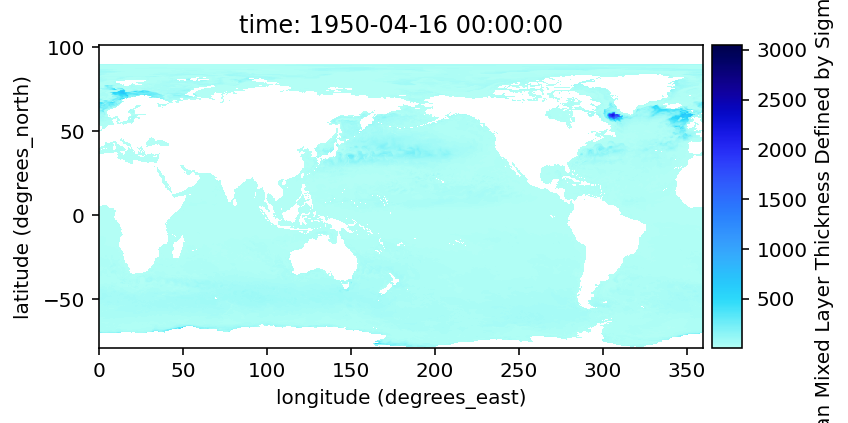
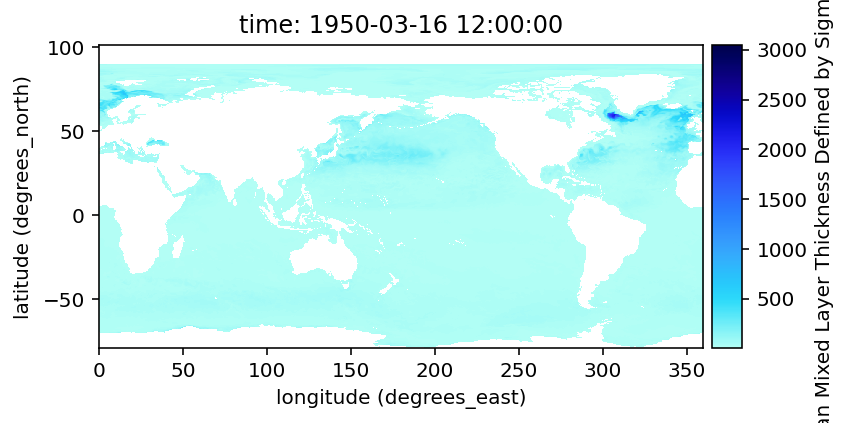
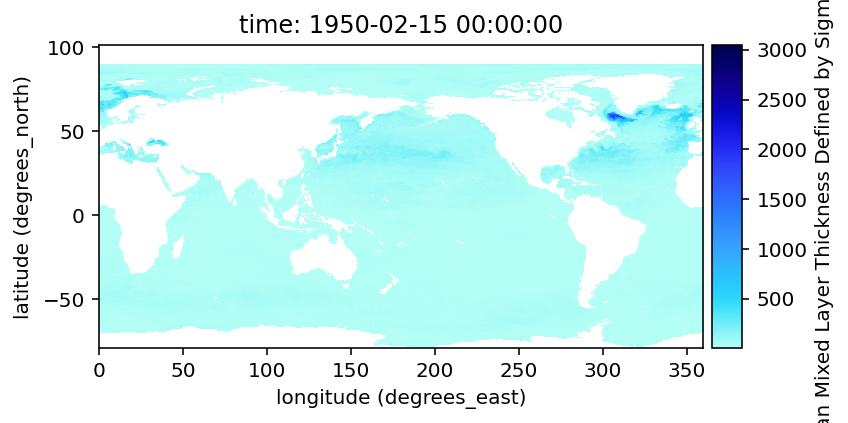
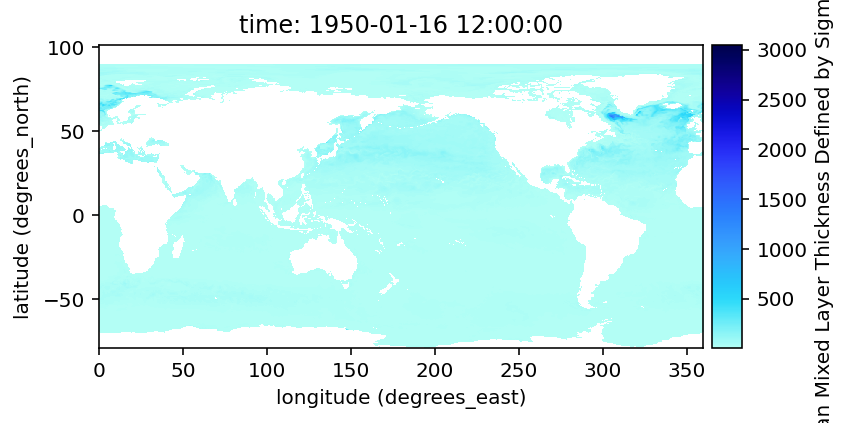

In [76]:
hv.extension("matplotlib")

opts.defaults(opts.Scatter3D(color="Value", cmap="fire", edgecolor="black", s=50))
# select every 20th time step
hv_ds = hv.Dataset(all_vars_xa["mlotst"].isel(time=slice(0, 50)))

var = hv_ds.to(hv.Image, kdims=["longitude", "latitude"], dynamic=False)
var[:, :, :].opts(colorbar=True, fig_size=150)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
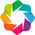

In [32]:
lat_range = [-32, 0]
lon_range = [130, 170]
# find mean of latitude and longitude within range, ignoring nans
vars_mean_gbr = all_vars_xa.sel(
    latitude=slice(lat_range[0], lat_range[1]), longitude=slice(lon_range[0], lon_range[1])).mean(dim=["latitude", "longitude"], skipna=True)

var_df = vars_mean_gbr.to_dataframe()

hv.extension('bokeh')


In [40]:
# import bokeh
%matplotlib inline

mlotst_curve = hv.Curve(var_df["mlotst"], "time")

tgt = mlotst_curve.relabel('Mixed layer ocean thickness').opts(width=800, height=300, labelled=['y'], toolbar='disable')
src = mlotst_curve.opts(width=800, height=100, yaxis=None, default_tools=[])

RangeToolLink(src, tgt, axes=['x', 'y'], boundsx=(datetime(2006, 1, 1) , datetime(2010, 1, 1)))

layout = (tgt + src).cols(1)
layout.opts(opts.Layout(shared_axes=False, merge_tools=False))

# bokeh.io.show(layout)
plt.show()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
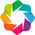

In [48]:
lat_range = [-32, 0]
lon_range = [130, 170]
# find mean of latitude and longitude within range, ignoring nans
vars_mean_gbr = all_vars_xa.sel(
    latitude=slice(lat_range[0], lat_range[1]), longitude=slice(lon_range[0], lon_range[1])).mean(dim=["latitude", "longitude"], skipna=True)

var_df = vars_mean_gbr.to_dataframe()

hv.extension('bokeh')



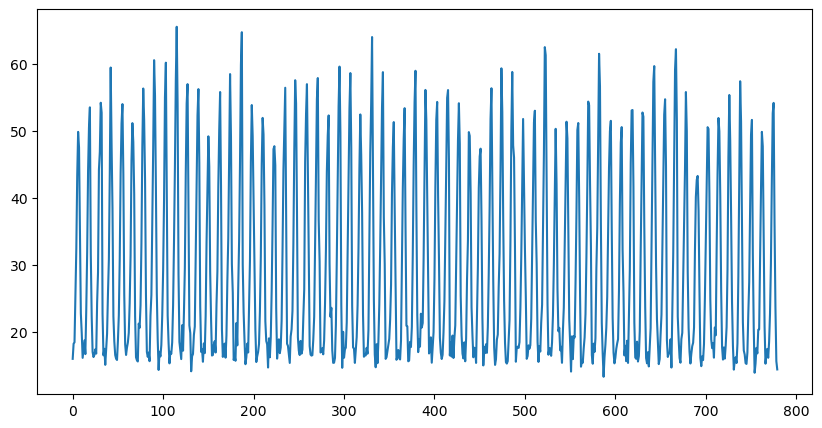

In [43]:
%matplotlib inline

fig = plt.figure(figsize=(10, 5))
plt.plot(vars_mean_gbr["mlotst"].values)
plt.show()

In [20]:
plt.plot(var_df["mlotst"])


ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (3120,) and arg 1 with shape (1560,).

In [9]:
mlotst_curve = hv.Curve(var_df["mlotst"], "time")

tgt = mlotst_curve.relabel('Mixed layer ocean thickness').opts(width=800, height=300, labelled=['y'], toolbar='disable')
src = mlotst_curve.opts(width=800, height=100, yaxis=None, default_tools=[])

RangeToolLink(src, tgt, axes=['x', 'y'], boundsx=(datetime(2006, 1, 1) , datetime(2010, 1, 1)))

layout = (tgt + src).cols(1)
layout.opts(opts.Layout(shared_axes=False, merge_tools=False))



:Layout
   .Curve.Mixed_layer_ocean_thickness :Curve   [time]   (mlotst)
   .Curve.I                           :Curve   [time]   (mlotst)